In [1]:
# Importing necessary tensorflow files
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.imagenet_utils import preprocess_input

In [2]:
# Python libraries
import numpy as np
import os

In [3]:
# Python libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [4]:
# Image preprocessing function
from tensorflow.keras.preprocessing.image import load_img,img_to_array

In [5]:
# Lambda function for image preprocessing
preprocessing_function= lambda x: preprocess_input(x,mode='tf')

In [6]:
# importing read classes function
from read_classes import read_classes

In [ ]:
# Mounting my google drive in colab notebook
from google.colab import drive
drive.mount('/content/drive')

In [8]:
# Loading saved model
model=load_model("/content/drive/My Drive/REAL ESTATE CV/IMG_ClASSIFY/model_data_augment_full_train/model_data_augmennt_full_train_checkpoints")

In [9]:
CLASS_DICT=read_classes()
CLASS_DICT

{0: 'Balcony',
 1: 'Bar',
 2: 'Bathroom',
 3: 'Bedroom',
 4: 'Bussiness Centre',
 5: 'Dining room',
 6: 'Exterior',
 7: 'Gym',
 8: 'Living room',
 9: 'Lobby',
 10: 'Patio',
 11: 'Pool',
 12: 'Restaurant',
 13: 'Sauna',
 14: 'Spa'}

In [10]:
# converts the prediction to string format for viewing
def pred_to_string(d):
    ans=""
    for classx,pred in d.items():
        ans+=classx+": "+str(pred)+", "
    return ans

In [11]:
# preprocess the image before feeding into network
def preprocess_image(img_path):
    img=load_img(img_path,target_size=(256,256))
    img=img_to_array(img)
    img=preprocessing_function(img)
    return img

In [12]:
# predict the class for the image using trained model
def predict_image(img_path,model):
    img=preprocess_image(img_path)
    preds=list(model.predict(np.expand_dims(img,0),batch_size=1).flatten())
    d={}
    for i,prob in enumerate(preds):
        d[CLASS_DICT[i]]=prob
#     {k: v for k, v in sorted(x.items(), key=lambda item: item[1])}
    d={classx: prob for classx,prob in sorted(d.items(),key=lambda item:item[1],reverse=True)[:3]}
    return pred_to_string(d)

In [13]:
IMAGE_DIRECTORY="/content/drive/My Drive/REAL ESTATE CV/IMG_ClASSIFY/test_images_random"

In [14]:
# function to display the image and the prediction
def predict_images_flow_directory():
    cnt=1
    for img_path in os.listdir(IMAGE_DIRECTORY):
        try:
            plt.figure()
            img_pathx=IMAGE_DIRECTORY+'/'+img_path
            img=mpimg.imread(img_pathx)
            plt.show();
            plt.imshow(img);
            print(predict_image(img_pathx,model))
        except:
            cnt+=1
            continue
    total_images=len(os.listdir(IMAGE_DIRECTORY))
    print('No. of images printed=',str(total_images-cnt))

<Figure size 432x288 with 0 Axes>

Restaurant: 0.8040354, Bar: 0.14375836, Dining room: 0.05031255, 


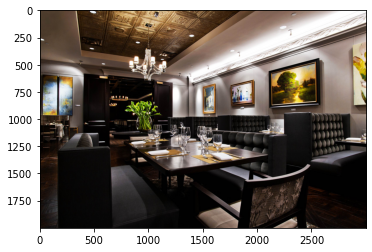

<Figure size 432x288 with 0 Axes>

Bedroom: 0.9994665, Living room: 0.00036222566, Balcony: 6.554404e-05, 


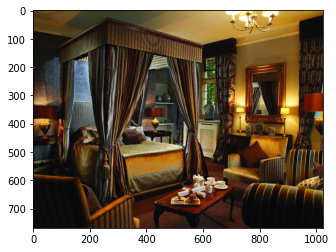

<Figure size 432x288 with 0 Axes>

Bedroom: 0.9307889, Spa: 0.046463374, Balcony: 0.017105741, 


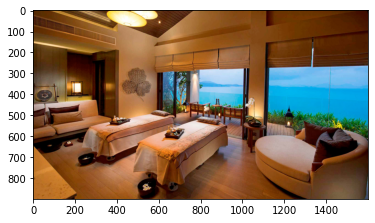

<Figure size 432x288 with 0 Axes>

Restaurant: 0.95093185, Bar: 0.04281803, Dining room: 0.0038749184, 


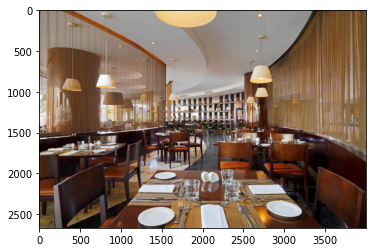

<Figure size 432x288 with 0 Axes>

Spa: 0.9976029, Bathroom: 0.0017611037, Lobby: 0.00035607736, 


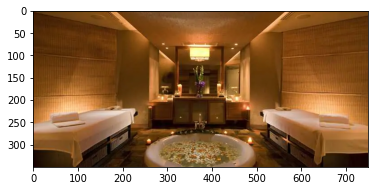

<Figure size 432x288 with 0 Axes>

Bussiness Centre: 0.47806585, Living room: 0.24191521, Bedroom: 0.16653116, 


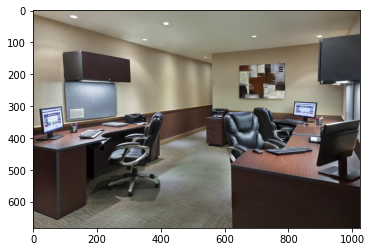

<Figure size 432x288 with 0 Axes>

Lobby: 0.6113424, Spa: 0.19015267, Exterior: 0.06451578, 


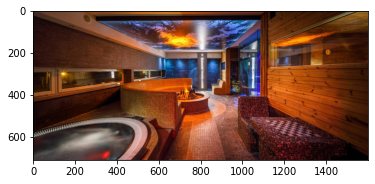

<Figure size 432x288 with 0 Axes>

Bedroom: 0.9964451, Patio: 0.0020872764, Living room: 0.0011510887, 


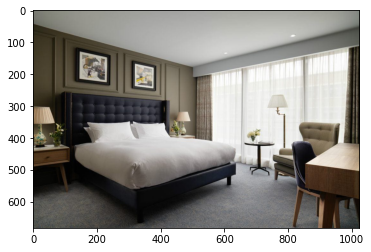

<Figure size 432x288 with 0 Axes>

Balcony: 0.9473817, Exterior: 0.049192324, Patio: 0.0032897424, 


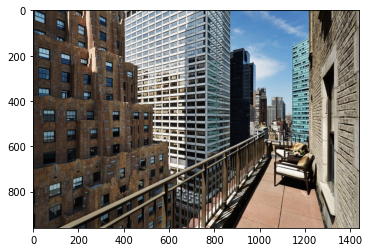

<Figure size 432x288 with 0 Axes>

Gym: 0.9224259, Bussiness Centre: 0.06855557, Lobby: 0.005191843, 


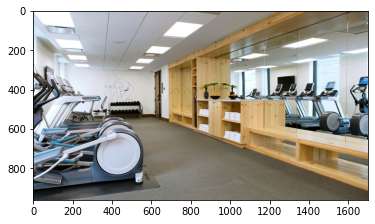

<Figure size 432x288 with 0 Axes>

Dining room: 0.8957035, Restaurant: 0.059595916, Bussiness Centre: 0.02432363, 


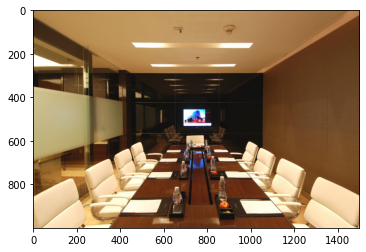

<Figure size 432x288 with 0 Axes>

Bussiness Centre: 0.99997604, Bar: 8.939451e-06, Balcony: 8.00998e-06, 


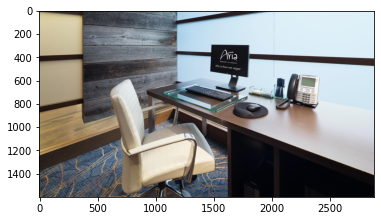

<Figure size 432x288 with 0 Axes>

Patio: 0.7497454, Restaurant: 0.10779571, Living room: 0.06772258, 


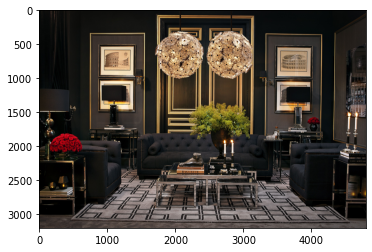

<Figure size 432x288 with 0 Axes>

Living room: 0.6378563, Bedroom: 0.18070732, Balcony: 0.1296589, 


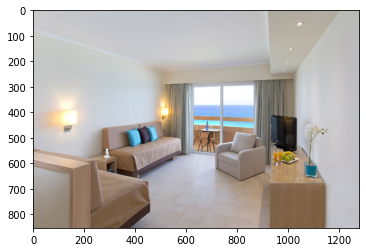

<Figure size 432x288 with 0 Axes>

Exterior: 0.9743025, Pool: 0.012422794, Restaurant: 0.008493519, 


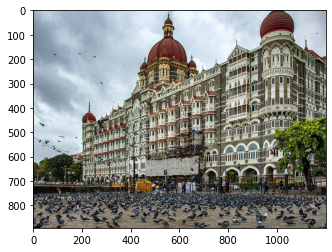

<Figure size 432x288 with 0 Axes>

Bedroom: 0.95030767, Living room: 0.027466336, Lobby: 0.011619862, 


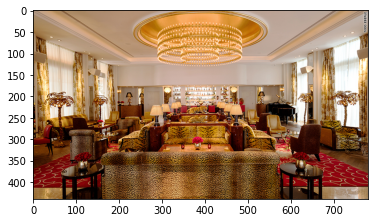

<Figure size 432x288 with 0 Axes>

Lobby: 0.86515003, Bar: 0.08809504, Restaurant: 0.018936625, 


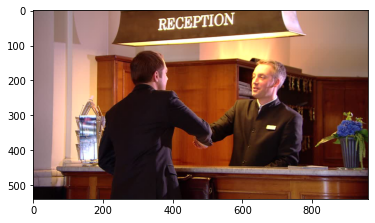

<Figure size 432x288 with 0 Axes>

Exterior: 0.8362188, Pool: 0.09786369, Patio: 0.03223023, 


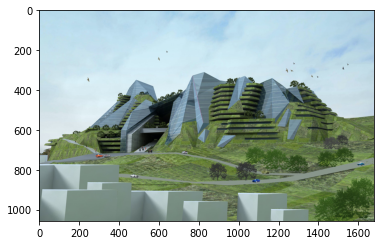

<Figure size 432x288 with 0 Axes>

Lobby: 0.99999917, Gym: 8.337769e-07, Exterior: 2.31357e-08, 


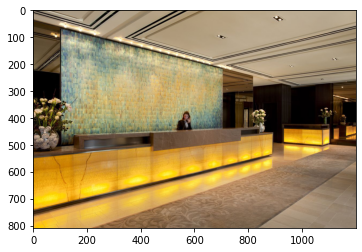

<Figure size 432x288 with 0 Axes>

Lobby: 0.9914067, Living room: 0.0050444165, Restaurant: 0.0011087995, 


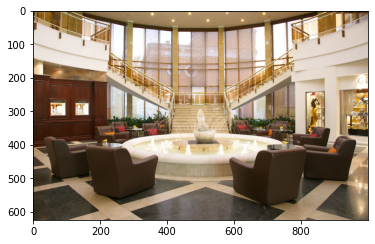

<Figure size 432x288 with 0 Axes>

Exterior: 0.9999924, Pool: 2.7979488e-06, Patio: 2.7665994e-06, 


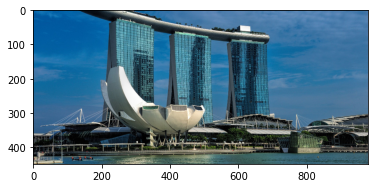

<Figure size 432x288 with 0 Axes>

Lobby: 0.95028645, Bussiness Centre: 0.049233373, Bar: 0.00033175212, 


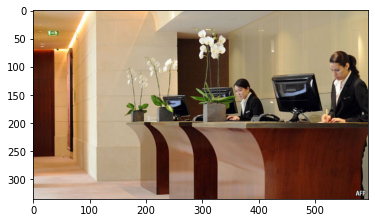

<Figure size 432x288 with 0 Axes>

Balcony: 0.8240983, Lobby: 0.082149744, Dining room: 0.057749055, 


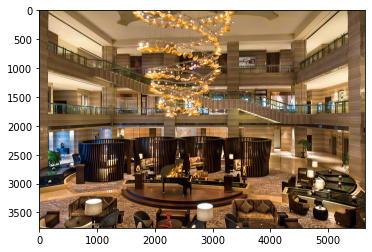

<Figure size 432x288 with 0 Axes>

Spa: 0.91273385, Gym: 0.0856179, Pool: 0.0011505418, 


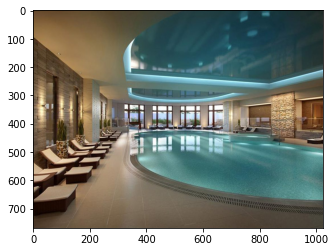

<Figure size 432x288 with 0 Axes>

Bedroom: 0.99374855, Spa: 0.0060012345, Bathroom: 0.00016132375, 


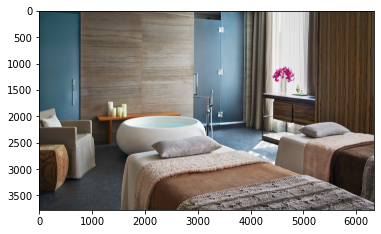

<Figure size 432x288 with 0 Axes>

Gym: 0.9987587, Balcony: 0.0005173421, Patio: 0.00032393093, 


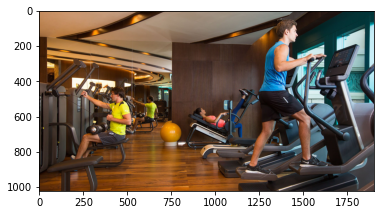

<Figure size 432x288 with 0 Axes>

Bedroom: 0.999746, Balcony: 0.00016263917, Lobby: 3.91926e-05, 


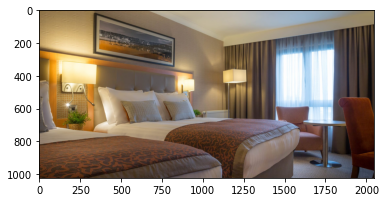

<Figure size 432x288 with 0 Axes>

Balcony: 0.9661025, Patio: 0.033575855, Bedroom: 8.218141e-05, 


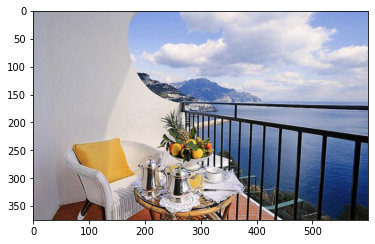

<Figure size 432x288 with 0 Axes>

Restaurant: 0.4659137, Lobby: 0.36118096, Bar: 0.078987315, 


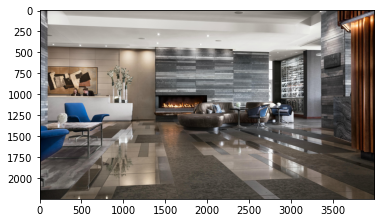

<Figure size 432x288 with 0 Axes>

Dining room: 0.59150213, Living room: 0.2865247, Balcony: 0.08957383, 


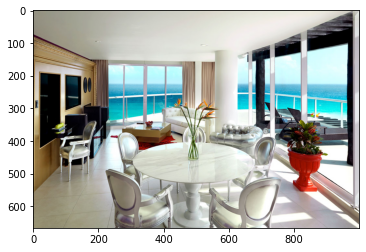

<Figure size 432x288 with 0 Axes>

Bedroom: 0.71262306, Lobby: 0.1712192, Living room: 0.10712428, 


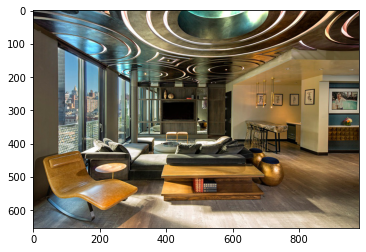

<Figure size 432x288 with 0 Axes>

Spa: 0.9999988, Sauna: 3.942728e-07, Exterior: 3.400138e-07, 


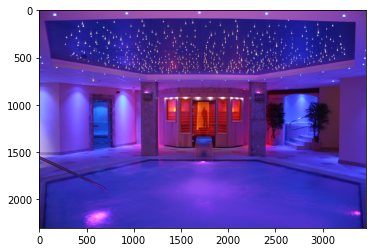

<Figure size 432x288 with 0 Axes>

Sauna: 0.737174, Living room: 0.24624, Dining room: 0.008704848, 


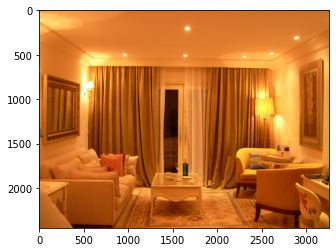

<Figure size 432x288 with 0 Axes>

Spa: 0.4787156, Lobby: 0.17846115, Bedroom: 0.16593426, 


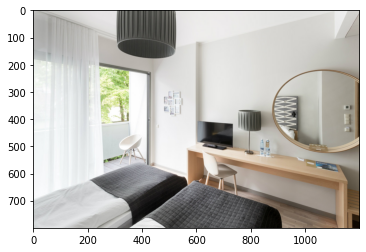

<Figure size 432x288 with 0 Axes>

Bedroom: 0.9764272, Living room: 0.012336788, Patio: 0.0074268244, 


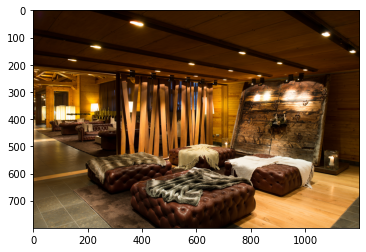

<Figure size 432x288 with 0 Axes>

Bathroom: 0.65027344, Spa: 0.3451223, Lobby: 0.0025383725, 


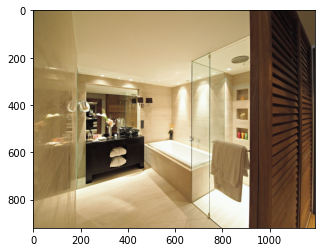

<Figure size 432x288 with 0 Axes>

Bathroom: 0.9993179, Spa: 0.0006709899, Sauna: 8.248351e-06, 


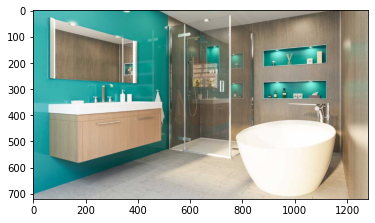

<Figure size 432x288 with 0 Axes>

Exterior: 0.3686598, Spa: 0.31903684, Pool: 0.23174219, 


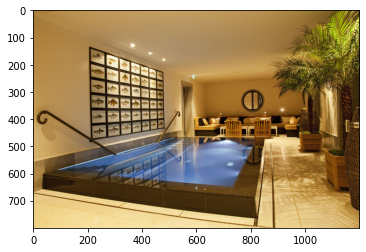

<Figure size 432x288 with 0 Axes>

Bathroom: 0.3125422, Restaurant: 0.17753364, Dining room: 0.15349847, 


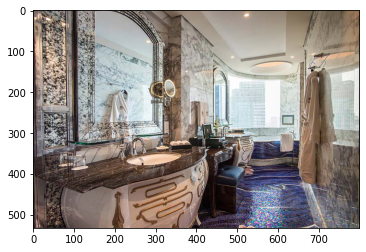

<Figure size 432x288 with 0 Axes>

Spa: 0.48705587, Lobby: 0.24396406, Dining room: 0.1457392, 


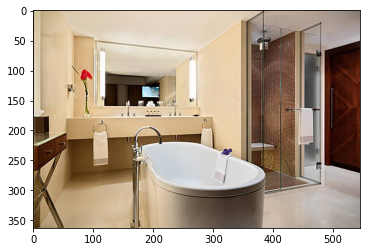

<Figure size 432x288 with 0 Axes>

Spa: 0.98660606, Exterior: 0.0053006904, Bedroom: 0.0045899167, 


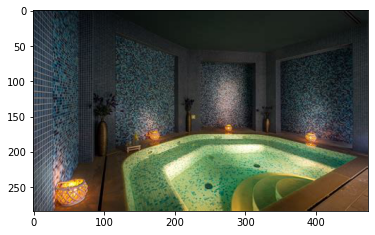

<Figure size 432x288 with 0 Axes>

Spa: 0.94727373, Sauna: 0.024479207, Restaurant: 0.008744906, 


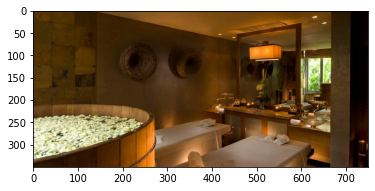

<Figure size 432x288 with 0 Axes>

Spa: 0.91745585, Lobby: 0.06496007, Gym: 0.009958319, 


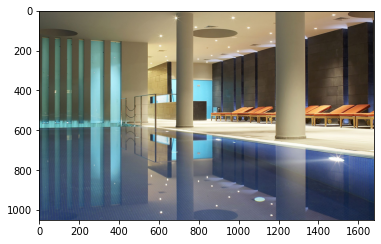

<Figure size 432x288 with 0 Axes>

Bathroom: 0.9613171, Spa: 0.029704522, Sauna: 0.008580232, 


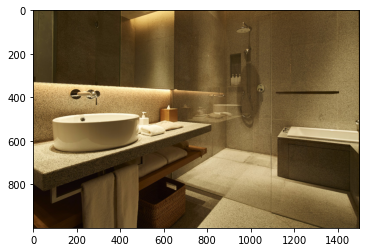

<Figure size 432x288 with 0 Axes>

Bedroom: 0.5785966, Spa: 0.4004868, Living room: 0.00996994, 


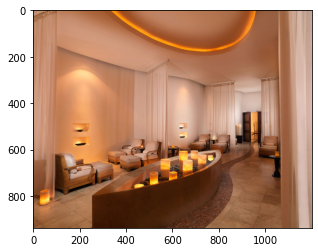

<Figure size 432x288 with 0 Axes>

Patio: 0.9796625, Spa: 0.01609438, Pool: 0.0025699635, 


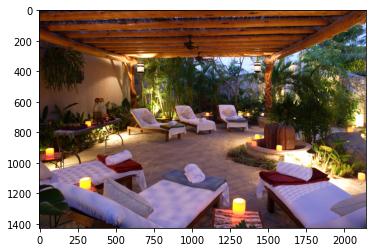

<Figure size 432x288 with 0 Axes>

Bathroom: 0.7806425, Spa: 0.21915029, Sauna: 0.00017859662, 


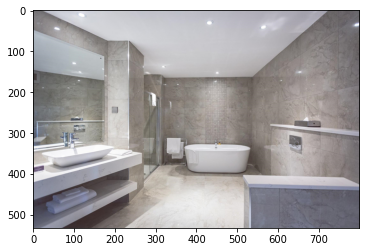

<Figure size 432x288 with 0 Axes>

Bathroom: 0.9914903, Spa: 0.008506083, Lobby: 2.8240427e-06, 


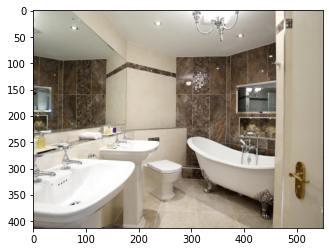

<Figure size 432x288 with 0 Axes>

Spa: 0.8226448, Bedroom: 0.17705601, Lobby: 0.00026111776, 


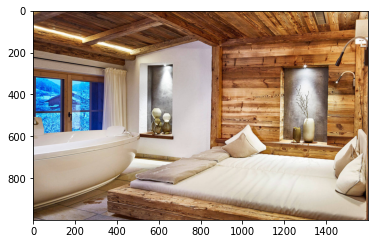

<Figure size 432x288 with 0 Axes>

Balcony: 0.9118864, Bedroom: 0.04195645, Bathroom: 0.0327246, 


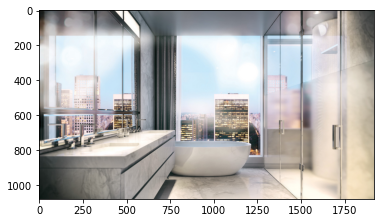

<Figure size 432x288 with 0 Axes>

Bathroom: 0.9999424, Sauna: 5.2885065e-05, Spa: 4.043013e-06, 


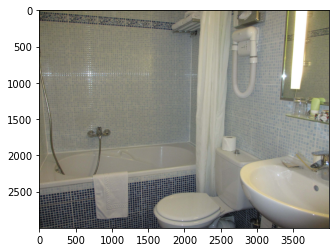

<Figure size 432x288 with 0 Axes>

Bathroom: 0.99385, Bussiness Centre: 0.004430546, Exterior: 0.0007132109, 


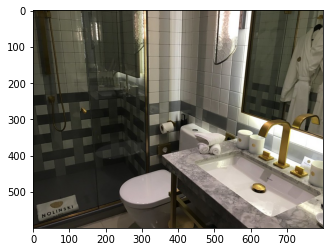

<Figure size 432x288 with 0 Axes>

Spa: 0.495501, Bathroom: 0.4607722, Lobby: 0.02637987, 


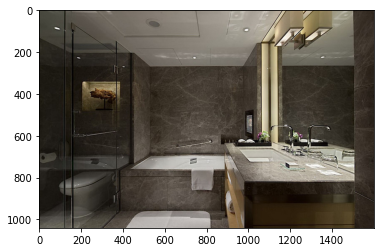

<Figure size 432x288 with 0 Axes>

Bathroom: 0.95556283, Spa: 0.03168807, Sauna: 0.011923309, 


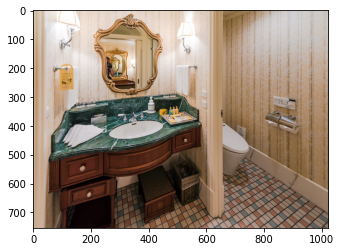

<Figure size 432x288 with 0 Axes>

Exterior: 0.9937767, Bathroom: 0.0026692387, Balcony: 0.0018940296, 


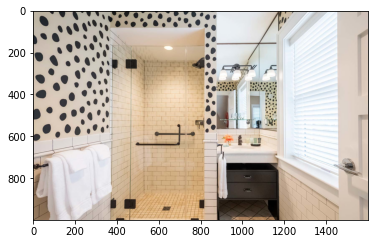

<Figure size 432x288 with 0 Axes>

Restaurant: 0.3521423, Bar: 0.23802528, Patio: 0.1566187, 


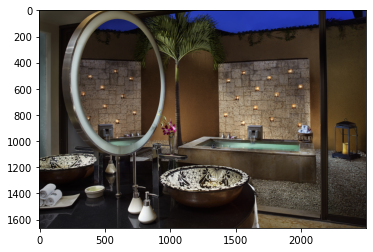

<Figure size 432x288 with 0 Axes>

Spa: 0.73060226, Bathroom: 0.2684584, Sauna: 0.00083389936, 


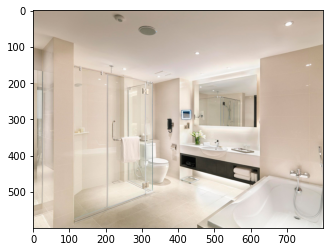

<Figure size 432x288 with 0 Axes>

Bathroom: 0.9874792, Spa: 0.012286604, Lobby: 0.00020825437, 


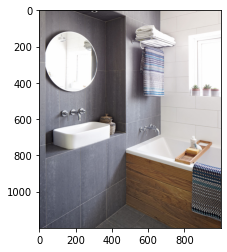

<Figure size 432x288 with 0 Axes>

Bathroom: 0.99883384, Sauna: 0.001078957, Balcony: 4.6139794e-05, 


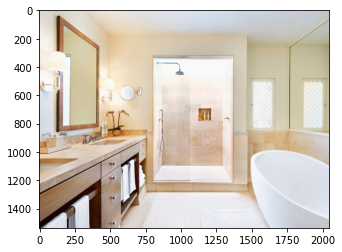

<Figure size 432x288 with 0 Axes>

Bedroom: 0.99059665, Lobby: 0.004242808, Spa: 0.0028138622, 


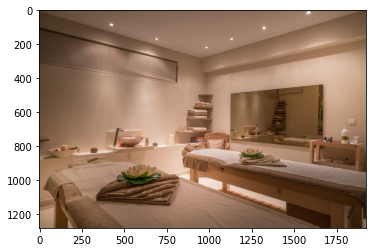

<Figure size 432x288 with 0 Axes>

Spa: 0.9752219, Bedroom: 0.021354154, Lobby: 0.0024095043, 


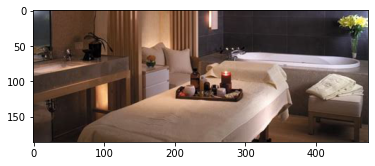

<Figure size 432x288 with 0 Axes>

Bathroom: 0.99967706, Spa: 0.00029986206, Sauna: 1.4872708e-05, 


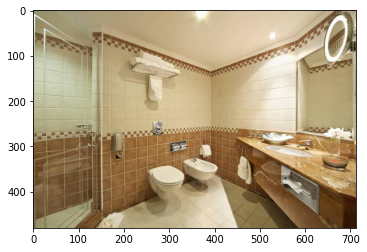

<Figure size 432x288 with 0 Axes>

Lobby: 0.580581, Spa: 0.31218562, Restaurant: 0.08914062, 


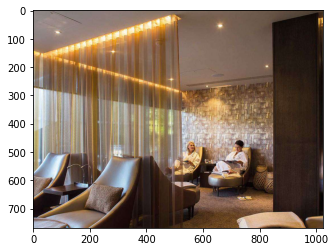

<Figure size 432x288 with 0 Axes>

Bathroom: 0.8479078, Spa: 0.15109892, Sauna: 0.00053768075, 


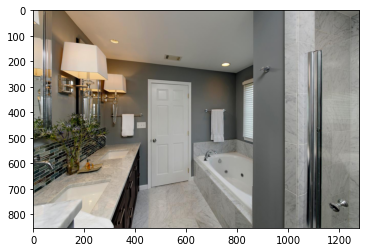

<Figure size 432x288 with 0 Axes>

Spa: 0.9725284, Pool: 0.021449253, Patio: 0.0037808674, 


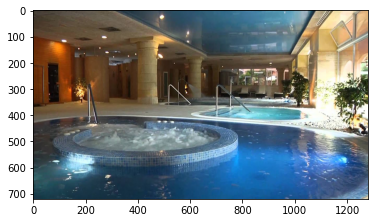

<Figure size 432x288 with 0 Axes>

Bathroom: 0.8288656, Spa: 0.1641068, Sauna: 0.0045868885, 


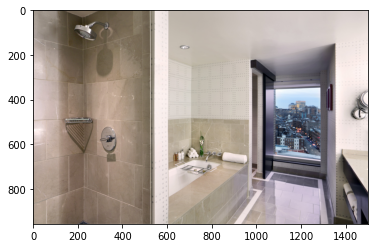

<Figure size 432x288 with 0 Axes>

Spa: 0.5406747, Living room: 0.37799194, Bedroom: 0.052866638, 


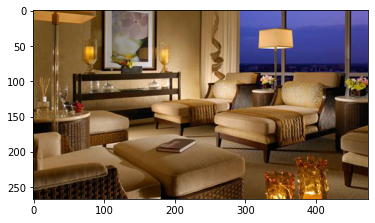

<Figure size 432x288 with 0 Axes>

Exterior: 1.0, Patio: 6.180982e-09, Restaurant: 1.8754387e-09, 


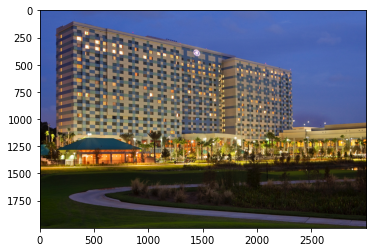

<Figure size 432x288 with 0 Axes>

Bedroom: 0.99438596, Spa: 0.0027553174, Patio: 0.0025824737, 


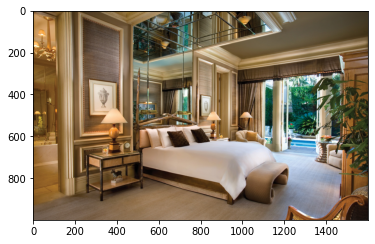

<Figure size 432x288 with 0 Axes>

Spa: 0.9937443, Pool: 0.0046062567, Gym: 0.00059214275, 


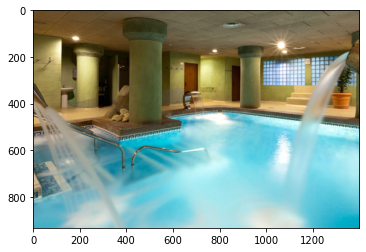

<Figure size 432x288 with 0 Axes>

Bedroom: 0.979251, Living room: 0.010436317, Spa: 0.0061962144, 


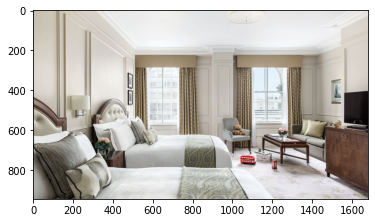

<Figure size 432x288 with 0 Axes>

Living room: 0.7608599, Bedroom: 0.10315651, Balcony: 0.068210684, 


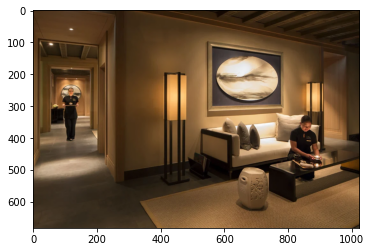

<Figure size 432x288 with 0 Axes>

Balcony: 0.66343504, Exterior: 0.28081223, Patio: 0.04671198, 


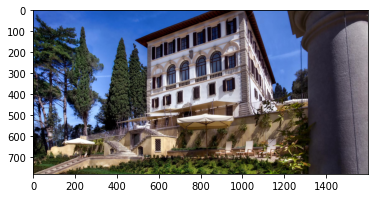

<Figure size 432x288 with 0 Axes>

Spa: 0.5136353, Bedroom: 0.48468423, Living room: 0.0014746115, 


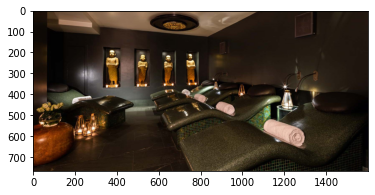

<Figure size 432x288 with 0 Axes>

Gym: 0.9958436, Patio: 0.0037846705, Dining room: 0.00016515359, 


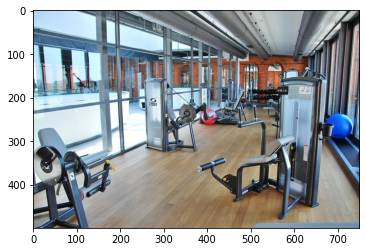

<Figure size 432x288 with 0 Axes>

Exterior: 0.9876282, Pool: 0.01231209, Patio: 3.640627e-05, 


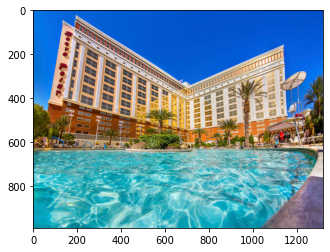

<Figure size 432x288 with 0 Axes>

Sauna: 0.9998097, Bathroom: 0.000106170664, Spa: 5.071202e-05, 


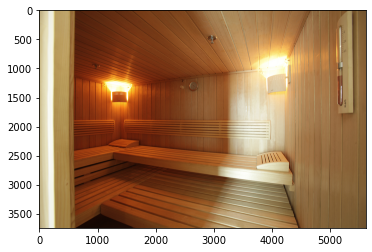

<Figure size 432x288 with 0 Axes>

Restaurant: 0.59542817, Patio: 0.29044124, Dining room: 0.055503633, 


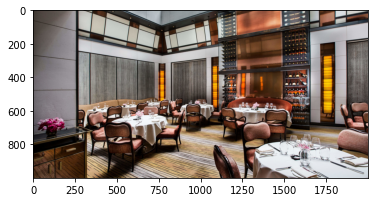

<Figure size 432x288 with 0 Axes>

Bedroom: 0.9845607, Patio: 0.0072305477, Bussiness Centre: 0.0060347063, 


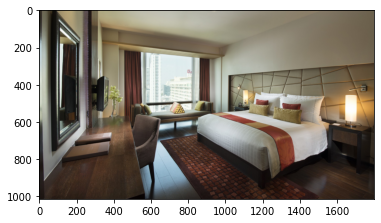

<Figure size 432x288 with 0 Axes>

Pool: 0.8264351, Spa: 0.085981764, Exterior: 0.07172828, 


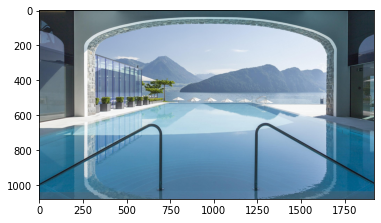

<Figure size 432x288 with 0 Axes>

Lobby: 0.7588273, Patio: 0.12513986, Restaurant: 0.083639026, 


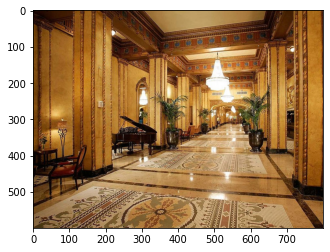

<Figure size 432x288 with 0 Axes>

Spa: 0.84607214, Gym: 0.11229287, Pool: 0.03298088, 


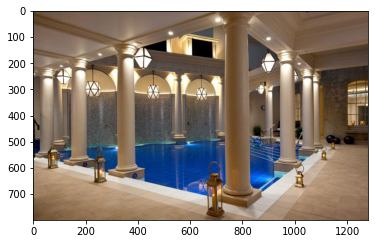

<Figure size 432x288 with 0 Axes>

Lobby: 0.99999523, Living room: 1.4695246e-06, Spa: 1.420858e-06, 


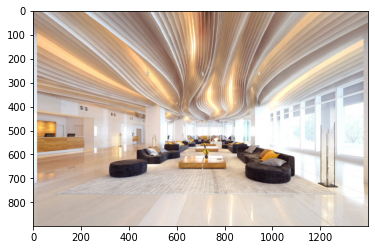

<Figure size 432x288 with 0 Axes>

Pool: 0.53819215, Exterior: 0.46000353, Patio: 0.0012683523, 


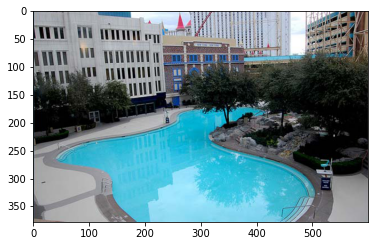

<Figure size 432x288 with 0 Axes>

Exterior: 0.5265545, Pool: 0.4681507, Spa: 0.0029697008, 


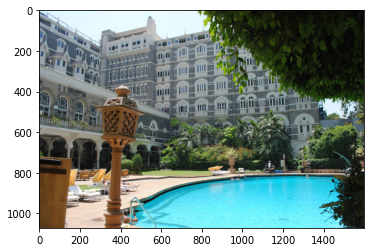

<Figure size 432x288 with 0 Axes>

Bussiness Centre: 0.9984491, Balcony: 0.00041494187, Dining room: 0.00039762876, 


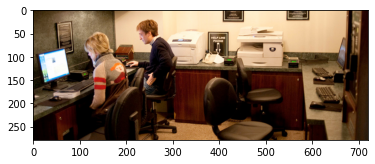

<Figure size 432x288 with 0 Axes>

Gym: 0.9922611, Restaurant: 0.002817675, Lobby: 0.0023908517, 


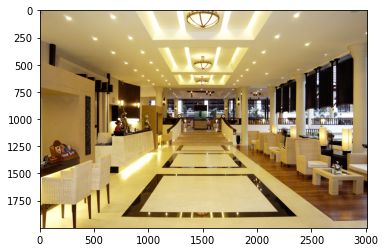

<Figure size 432x288 with 0 Axes>

Gym: 1.0, Bussiness Centre: 1.4836458e-08, Spa: 1.3625427e-08, 


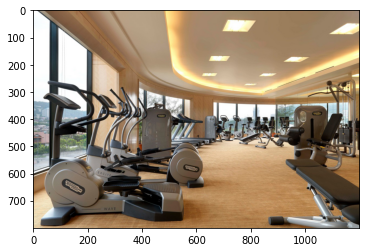

<Figure size 432x288 with 0 Axes>

Pool: 0.31439206, Exterior: 0.3043025, Balcony: 0.174289, 


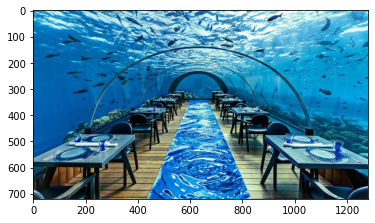

<Figure size 432x288 with 0 Axes>

Living room: 0.7086845, Restaurant: 0.10242679, Bedroom: 0.07031946, 


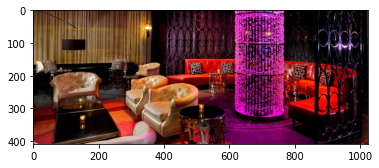

<Figure size 432x288 with 0 Axes>

Restaurant: 0.9710135, Patio: 0.014889717, Bar: 0.0074399184, 


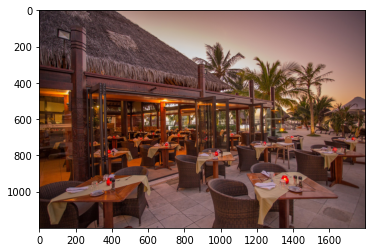

<Figure size 432x288 with 0 Axes>

Patio: 0.7981494, Pool: 0.18474084, Exterior: 0.009782171, 


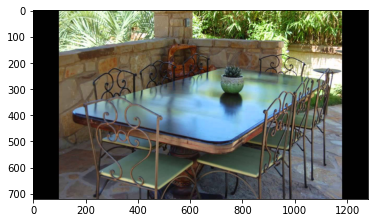

<Figure size 432x288 with 0 Axes>

Pool: 0.8907941, Patio: 0.10106619, Exterior: 0.00552184, 


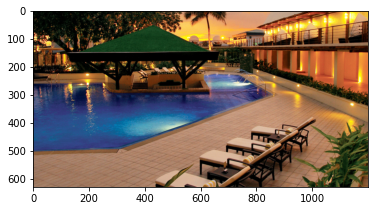

<Figure size 432x288 with 0 Axes>

Pool: 0.95313686, Exterior: 0.04428051, Patio: 0.001868729, 


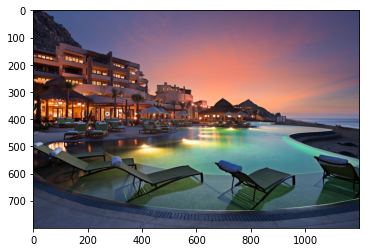

<Figure size 432x288 with 0 Axes>

Lobby: 0.7385794, Dining room: 0.08175543, Living room: 0.079365455, 


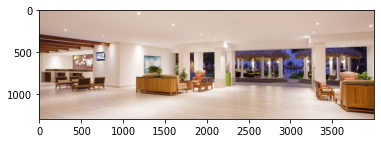

<Figure size 432x288 with 0 Axes>

Sauna: 0.9995091, Spa: 0.0004027086, Bathroom: 3.545969e-05, 


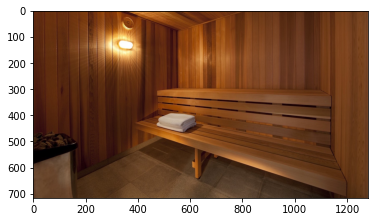

<Figure size 432x288 with 0 Axes>

Pool: 0.75843406, Exterior: 0.23284209, Balcony: 0.0033591622, 


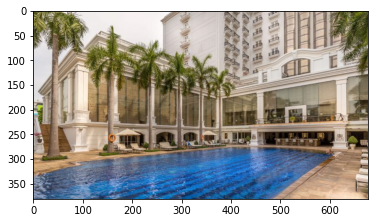

<Figure size 432x288 with 0 Axes>

Pool: 0.99559855, Patio: 0.0028359594, Spa: 0.00089088234, 


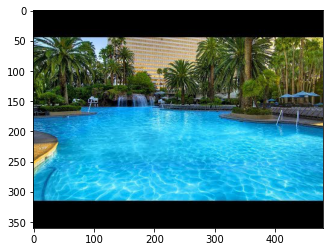

<Figure size 432x288 with 0 Axes>

Lobby: 0.99999106, Bar: 8.976201e-06, Living room: 1.4935072e-08, 


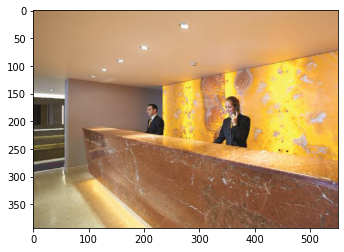

<Figure size 432x288 with 0 Axes>

Pool: 0.8978517, Exterior: 0.060441166, Patio: 0.021036407, 


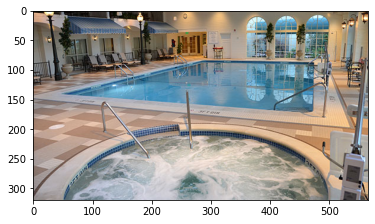

<Figure size 432x288 with 0 Axes>

Bussiness Centre: 0.96021795, Gym: 0.015108431, Bedroom: 0.0074027567, 


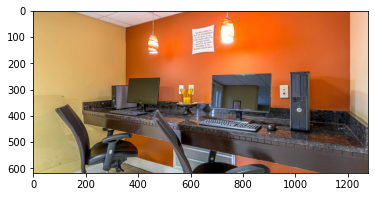

<Figure size 432x288 with 0 Axes>

Bussiness Centre: 0.999711, Living room: 0.00026539783, Bedroom: 1.9996925e-05, 


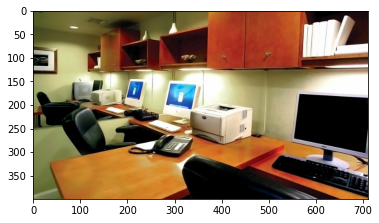

<Figure size 432x288 with 0 Axes>

Dining room: 0.36432448, Living room: 0.29062334, Restaurant: 0.12997372, 


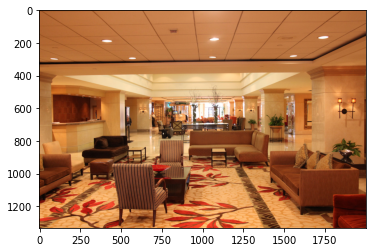

<Figure size 432x288 with 0 Axes>

Exterior: 0.8571805, Balcony: 0.12663777, Patio: 0.012853048, 


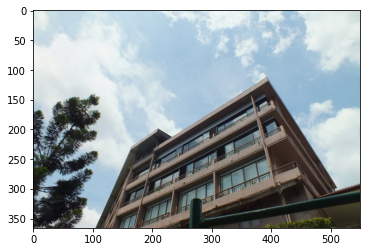

<Figure size 432x288 with 0 Axes>

Living room: 0.9189578, Lobby: 0.049003437, Bedroom: 0.027980775, 


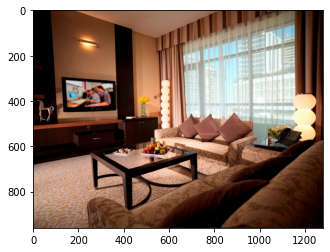

<Figure size 432x288 with 0 Axes>

Spa: 0.8376148, Bedroom: 0.11261932, Lobby: 0.042180933, 


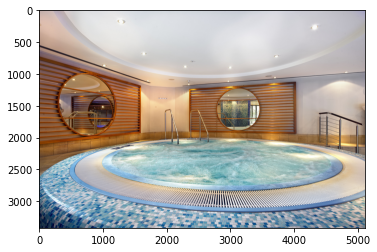

<Figure size 432x288 with 0 Axes>

Balcony: 0.46691886, Sauna: 0.44341722, Patio: 0.08964358, 


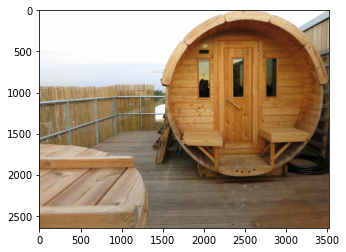

<Figure size 432x288 with 0 Axes>

Pool: 0.49641904, Exterior: 0.2310523, Spa: 0.13637815, 


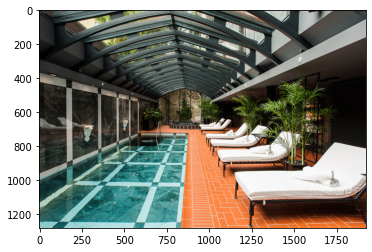

<Figure size 432x288 with 0 Axes>

Lobby: 0.9969505, Gym: 0.0009985876, Living room: 0.0008442192, 


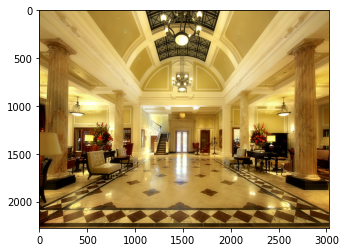

<Figure size 432x288 with 0 Axes>

Bedroom: 0.99995637, Bussiness Centre: 2.1102627e-05, Patio: 1.5330863e-05, 
No. of images printed= 109


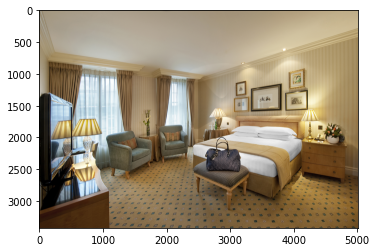

In [15]:
predict_images_flow_directory()